In [3]:
from bokeh.plotting import figure, output_file, show, output_notebook

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib

n1 = 3
n2 = 3
n3 = 3
n4 = 3
nt = 1461
nz = 90
nr = 5 # responses

a = np.ndarray((n1, n2, n3, n4, nt, nz, nr), dtype=np.float) * np.nan

d = pd.read_csv('../intermediate//parameterdict.csv')

for i, x1, x2, x3, x4, id in d.itertuples():
    t = pd.read_csv('../simulations/id/{:02d}/t.csv.bz2'.format(id), header=None).as_matrix()
    chl = pd.read_csv('../simulations/id/{:02d}/chl.csv.bz2'.format(id), header=None).as_matrix()
    tp = pd.read_csv('../simulations/id/{:02d}/totp.csv.bz2'.format(id), header=None).as_matrix()
    o2a = pd.read_csv('../simulations/id/{:02d}/O2abs.csv.bz2'.format(id), header=None).as_matrix()
    o2r = pd.read_csv('../simulations/id/{:02d}/O2rel.csv.bz2'.format(id), header=None).as_matrix()
    a[x1-1, x2-1, x3-1, x4-1, :, :, 0] = t
    a[x1-1, x2-1, x3-1, x4-1, :, :, 1] = chl
    a[x1-1, x2-1, x3-1, x4-1, :, :, 2] = tp
    a[x1-1, x2-1, x3-1, x4-1, :, :, 3] = o2a
    a[x1-1, x2-1, x3-1, x4-1, :, :, 4] = o2r

In [5]:
import datetime
dates = [datetime.date(2000, 1, 1) + datetime.timedelta(i) for i in range(nt)]

In [21]:
from bokeh.io import output_file, show, output_notebook
from bokeh.layouts import gridplot, widgetbox
from bokeh.plotting import figure
from bokeh.models import CustomJS, Slider

output_notebook()

s1 = figure(height=400, width=600, x_axis_type='datetime', tools='xwheel_zoom,xpan,reset,save,crosshair', 
            title='Surface water temperature (C)')
s1.line(dates[10:], a[0, 0, 0, 0, 10:, 0, 0], color='blue', legend='no reduction')
s1.line(dates[10:], a[0, 0, 1, 0, 10:, 0, 0], color='red', legend='45% reduction')
s1.line(dates[10:], a[0, 0, 2, 0, 10:, 0, 0], color='brown', legend='90% reduction')
s2 = figure(height=400, width=600, x_axis_type='datetime', tools='xwheel_zoom,xpan,reset,save,crosshair', 
            x_range=s1.x_range, 
            title='Surface O2 concentration, absolute')
s2.line(dates[10:], a[0, 0, 0, 0, 10:, 0, 1], color='blue')
s2.line(dates[10:], a[0, 0, 1, 0, 10:, 0, 1], color='red')
s2.line(dates[10:], a[0, 0, 2, 0, 10:, 0, 1], color='brown')
s3 = figure(height=400, width=600, x_axis_type='datetime', tools='xwheel_zoom,xpan,reset,save,crosshair', 
            x_range=s1.x_range, 
            title='Surface total P concentration')
s3.line(dates[10:], a[0, 0, 0, 0, 10:, 0, 2], color='blue')
s3.line(dates[10:], a[0, 0, 1, 0, 10:, 0, 2], color='red')
s3.line(dates[10:], a[0, 0, 2, 0, 10:, 0, 2], color='brown')
s4 = figure(height=400, width=600, x_axis_type='datetime', tools='xwheel_zoom,xpan,reset,save,crosshair', 
            x_range=s1.x_range, 
            title='Surface Chl concentration')
s4.line(dates[10:], a[0, 0, 0, 0, 10:, 0, 3], color='blue')
s4.line(dates[10:], a[0, 0, 1, 0, 10:, 0, 3], color='red')
s4.line(dates[10:], a[0, 0, 2, 0, 10:, 0, 3], color='brown')


show(gridplot([[s1, s4], [s2, s3]]))

Loading BokehJS ...

In [29]:
from bokeh.io import output_file, show, output_notebook
from bokeh.layouts import gridplot, widgetbox
from bokeh.plotting import figure
from bokeh.models import CustomJS, Slider
import pandas as pd

d = pd.read_csv('../intermediate//parameterdict.csv')


output_notebook()

s1 = figure(height=400, width=600, x_axis_type='datetime', tools='xwheel_zoom,xpan,reset,save,crosshair', 
            title='Surface water temperature (C)')
s2 = figure(height=400, width=600, x_axis_type='datetime', tools='xwheel_zoom,xpan,reset,save,crosshair', 
            x_range=s1.x_range, 
            title='Surface O2 concentration, absolute')
s3 = figure(height=400, width=600, x_axis_type='datetime', tools='xwheel_zoom,xpan,reset,save,crosshair', 
            x_range=s1.x_range, 
            title='Surface total P concentration')
s4 = figure(height=400, width=600, x_axis_type='datetime', tools='xwheel_zoom,xpan,reset,save,crosshair', 
            x_range=s1.x_range, 
            title='Surface Chl concentration')
for i, x1, x2, x3, x4, id in d.itertuples():
    s1.line(dates[10:], a[x1-1, x2-1, x3-1, x4-1, 10:, 0, 0], color=['blue', 'orange', 'brown'][x4-1], line_dash=[[6, 6], [8, 2], [1, 0]][x3-1])
    s2.line(dates[10:], a[x1-1, x2-1, x3-1, x4-1, 10:, 0, 1], color=['blue', 'orange', 'brown'][x4-1], line_dash=[[6, 6], [8, 2], [1, 0]][x3-1])
    s3.line(dates[10:], a[x1-1, x2-1, x3-1, x4-1, 10:, 0, 2], color=['blue', 'orange', 'brown'][x4-1], line_dash=[[6, 6], [8, 2], [1, 0]][x3-1])
    s4.line(dates[10:], a[x1-1, x2-1, x3-1, x4-1, 10:, 0, 3], color=['blue', 'orange', 'brown'][x4-1], line_dash=[[6, 6], [8, 2], [1, 0]][x3-1])

show(gridplot([[s1, s4], [s2, s3]]))

Loading BokehJS ...

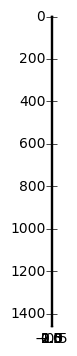

In [25]:
plt.imshow(np.transpose(a[0, 0, :, 0, :, 30, 3]))
plt.show()

In [27]:
np.transpose(a[0, 0, :, 0, :, 30, 3])

array([[  5.87940000e-01,   5.87940000e-01,   5.87940000e-01],
       [  5.55570000e-01,   5.55570000e-01,   5.55570000e-01],
       [  5.52380000e-01,   5.52380000e-01,   5.52380000e-01],
       ..., 
       [  7.83590000e-08,   7.83590000e-08,   7.83610000e-08],
       [  4.15270000e-08,   4.15270000e-08,   4.15270000e-08],
       [  4.19360000e-08,   4.19360000e-08,   4.19370000e-08]])